In [1]:
import pycircos
import collections
import matplotlib.pyplot as plt
Garc = pycircos.Garc
Gcircle = pycircos.Gcircle

In [2]:
import os
import pandas as pd
import numpy as np
import matplotlib as mpl
import seaborn as sns

# Primary Samples

In [3]:
#Set chromosomes
circle = Gcircle(figsize=(50,50))
with open("/Users/ryanyutian/Desktop/202306_CIRCOS/hg38_chromosome_general.csv") as f:
    f.readline()
    for line in f:
        line   = line.rstrip().split(",")
        name   = line[0][3:]
        length = int(line[-1]) 
        arc    = Garc(arc_id=name, size=length, interspace=2, facecolor="#FFFFFF00", \
                      raxis_range=(500,530), labelposition=40, label_visible=True, labelsize=50)
        circle.add_garc(arc)

<Figure size 3600x3600 with 0 Axes>

In [4]:
circle.set_garcs() 

In [5]:
#cytoband
import collections
color_dict   = {"gneg":"#FFFFFF00", "gpos25":"#EEEEEE", "gpos50":"#BBBBBB", "gpos75":"#777777", "gpos100":"#000000", "gvar":"#FFFFFF00", "stalk":"#C01E27", 
               "acen":"#D82322"}

arcdata_dict = collections.defaultdict(dict)
with open("/Users/ryanyutian/Desktop/202306_CIRCOS/hg38_chromosome_cytoband.csv") as f:
    f.readline()
    for line in f:
        line  = line.rstrip().split(",")
        name  = line[0][3:]   
        start = int(line[1])-1 
        width = int(line[2])-(int(line[1])-1) 
        if name not in arcdata_dict:
            arcdata_dict[name]["positions"] = []
            arcdata_dict[name]["widths"]    = [] 
            arcdata_dict[name]["colors"]    = [] 
        arcdata_dict[name]["positions"].append(start) 
        arcdata_dict[name]["widths"].append(width)
        arcdata_dict[name]["colors"].append(color_dict[line[-1]])

for key in arcdata_dict:
    circle.barplot(key, data=[1]*len(arcdata_dict[key]["positions"]), positions=arcdata_dict[key]["positions"], 
                   width=arcdata_dict[key]["widths"], raxis_range=[500,530], facecolor=arcdata_dict[key]["colors"])    
    

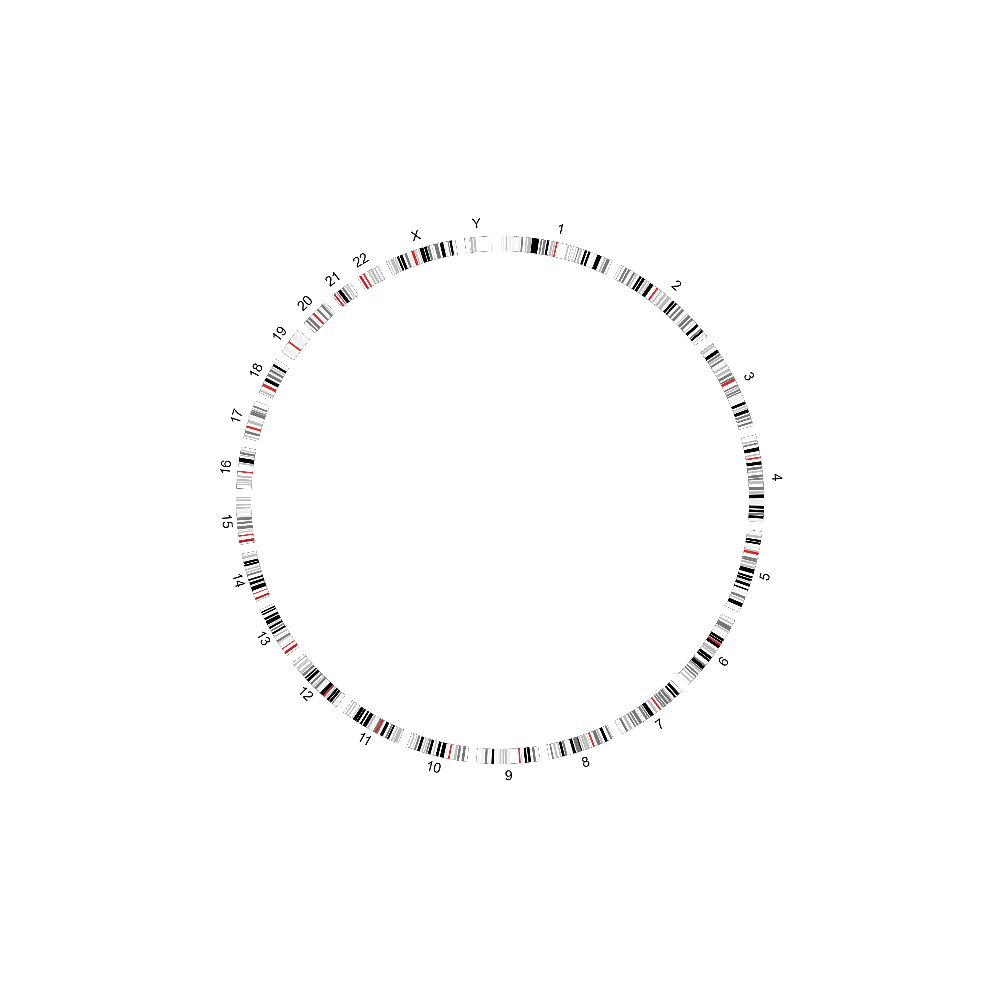

In [6]:
circle.figure

In [7]:
#heatmap
values_all   = [] 
arcdata_dict = collections.defaultdict(dict)
with open("/Users/ryanyutian/Desktop/Manuscript/CIRCOS/primary_relapse_data/primary/large_DEL_heatmap_primary_sample_percent.csv") as f:
    f.readline()
    for line in f:
        line  = line.rstrip().split(",")
        name  = line[0][3:]
        start = int(line[1])-1
        end   = int(line[2]) 
        width = end-start
        if name not in arcdata_dict:
            arcdata_dict[name]["positions"] = []
            arcdata_dict[name]["widths"]    = [] 
            arcdata_dict[name]["values"]    = [] 
        arcdata_dict[name]["positions"].append(start) 
        arcdata_dict[name]["widths"].append(width)
        arcdata_dict[name]["values"].append(float(line[-1]))
        values_all.append(float(line[-1]))

vmin, vmax = 0, 1

for key in arcdata_dict:
    circle.heatmap(key, data=arcdata_dict[key]["values"], positions=arcdata_dict[key]["positions"], 
                   width=arcdata_dict[key]["widths"], raxis_range=[440,490], vmin=vmin, vmax=vmax, 
                   cmap=sns.color_palette("light:b", as_cmap=True), spine=True)

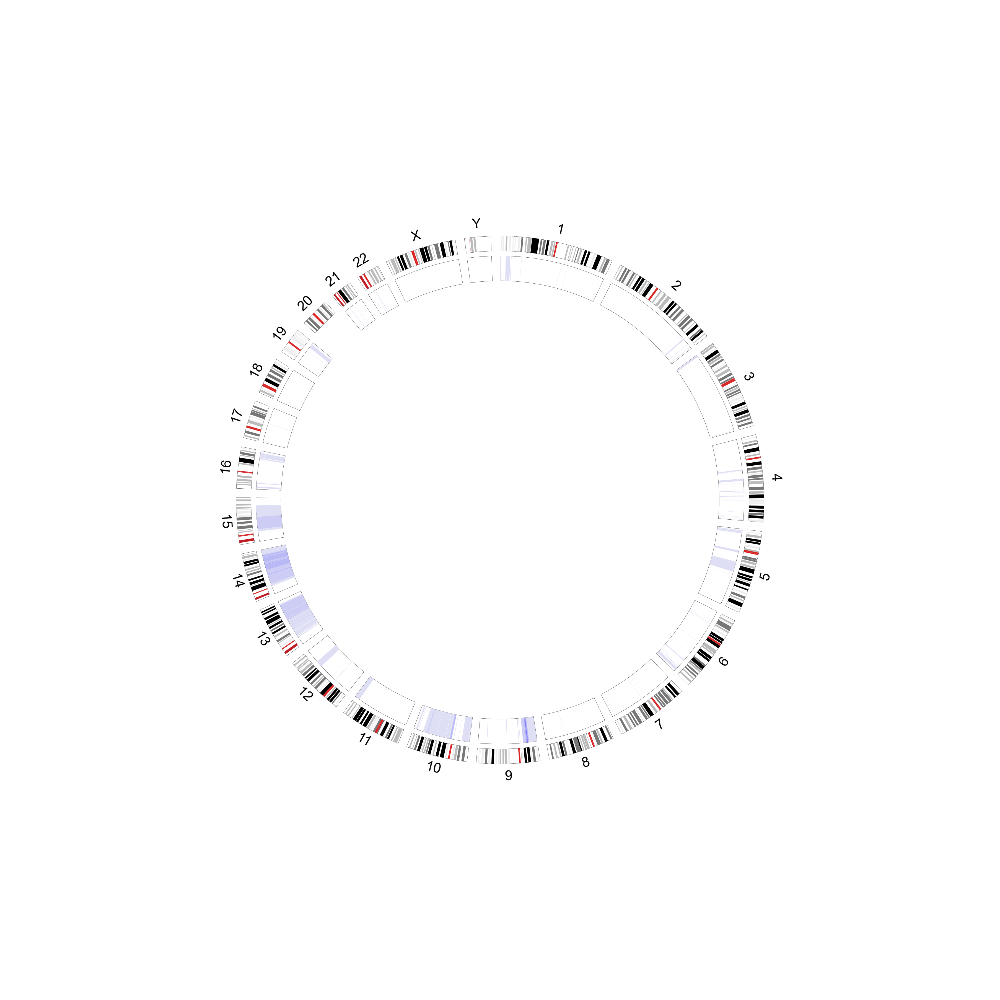

In [8]:
circle.figure

In [9]:
#heatmap
values_all   = [] 
arcdata_dict = collections.defaultdict(dict)
with open("/Users/ryanyutian/Desktop/Manuscript/CIRCOS/primary_relapse_data/primary/large_DUP_heatmap_primary_sample_percent.csv") as f:
    f.readline()
    for line in f:
        line  = line.rstrip().split(",")
        name  = line[0][3:]    
        start = int(line[1])-1
        end   = int(line[2]) 
        width = end-start 
        if name not in arcdata_dict:
            arcdata_dict[name]["positions"] = []
            arcdata_dict[name]["widths"]    = [] 
            arcdata_dict[name]["values"]    = [] 
        arcdata_dict[name]["positions"].append(start) 
        arcdata_dict[name]["widths"].append(width)
        arcdata_dict[name]["values"].append(float(line[-1]))
        values_all.append(float(line[-1]))

vmin, vmax = 0, 1
for key in arcdata_dict:
    circle.heatmap(key, data=arcdata_dict[key]["values"], positions=arcdata_dict[key]["positions"], 
                   width=arcdata_dict[key]["widths"], raxis_range=[380,430], vmin=vmin, vmax=vmax, 
                   cmap=plt.cm.Reds, spine=True)

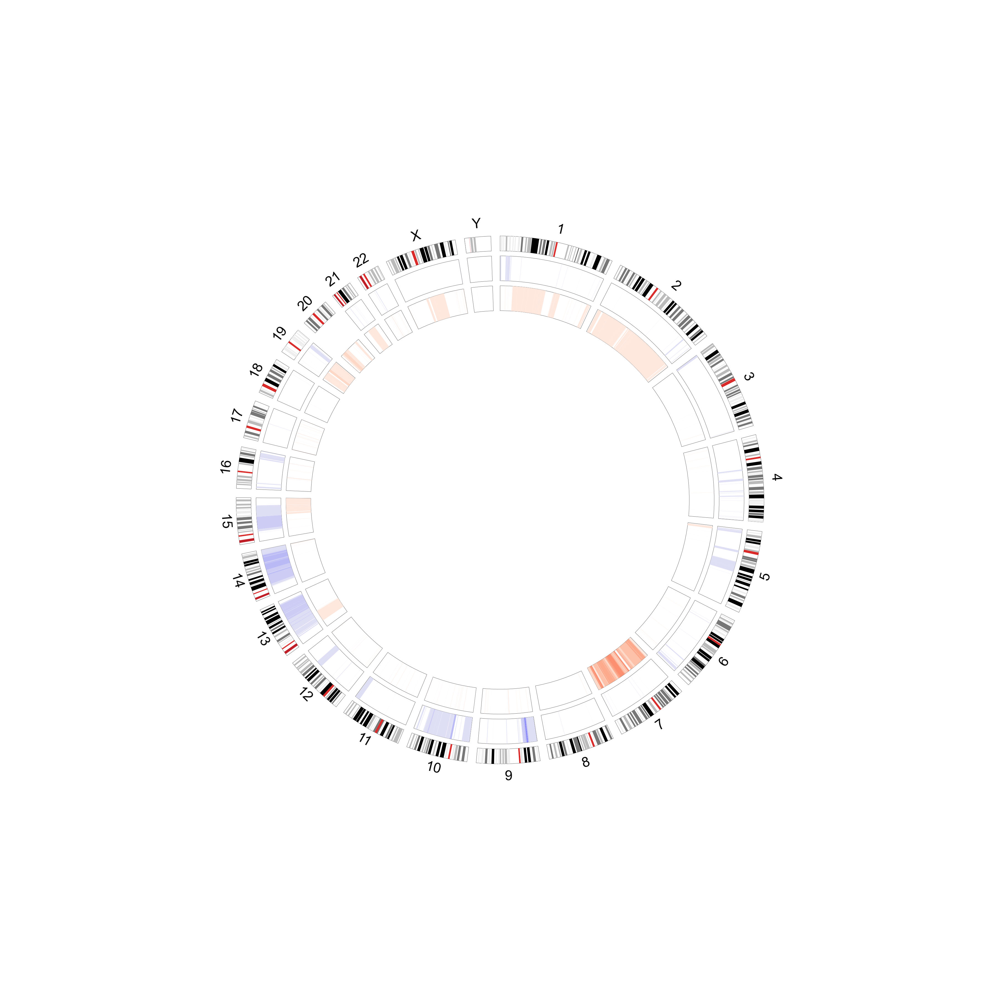

In [10]:
circle.figure

In [11]:
#linkplot - inversion

values_all   = [] 
arcdata_dict = collections.defaultdict(dict)

with open("/Users/ryanyutian/Desktop/Manuscript/CIRCOS/primary_relapse_data/primary_sample_inversion.csv") as f:
    f.readline()
    for line in f:
        line  = line.rstrip().split(",")
        name1  = line[0][3:]
        start1 = int(line[1])-1
        end1   = int(line[2])
        name2  = line[3][3:]
        start2 = int(line[4])-1
        end2   = int(line[5])
        source = (name1, start1, end1, 380)
        destination = (name2, start2, end2, 380)
        circle.chord_plot(source, destination, edgecolor="#E67E22", linewidth=2)


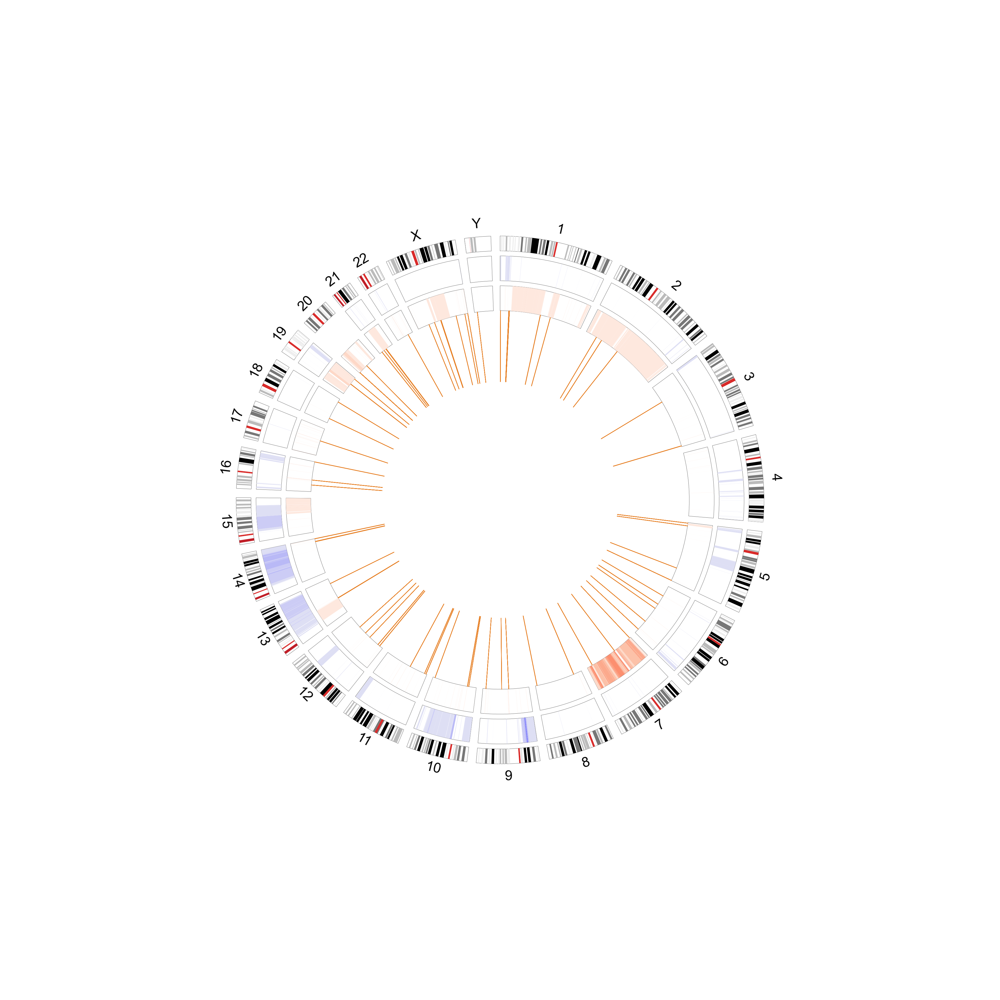

In [12]:
circle.figure

In [13]:
#linkplot - Translocation

values_all   = [] 
arcdata_dict = collections.defaultdict(dict)

with open("/Users/ryanyutian/Desktop/Manuscript/CIRCOS/primary_relapse_data/primary_sample_translocation.csv") as f:
    f.readline()
    for line in f:
        line  = line.rstrip().split(",")
        name1  = line[0][3:]
        start1 = int(line[1])-1
        end1   = int(line[2])
        name2  = line[3][3:]
        start2 = int(line[4])-1
        end2   = int(line[5])
        source = (name1, start1, end1, 380)
        destination = (name2, start2, end2, 380)
        circle.chord_plot(source, destination, edgecolor="#4C2D7F", linewidth=2)


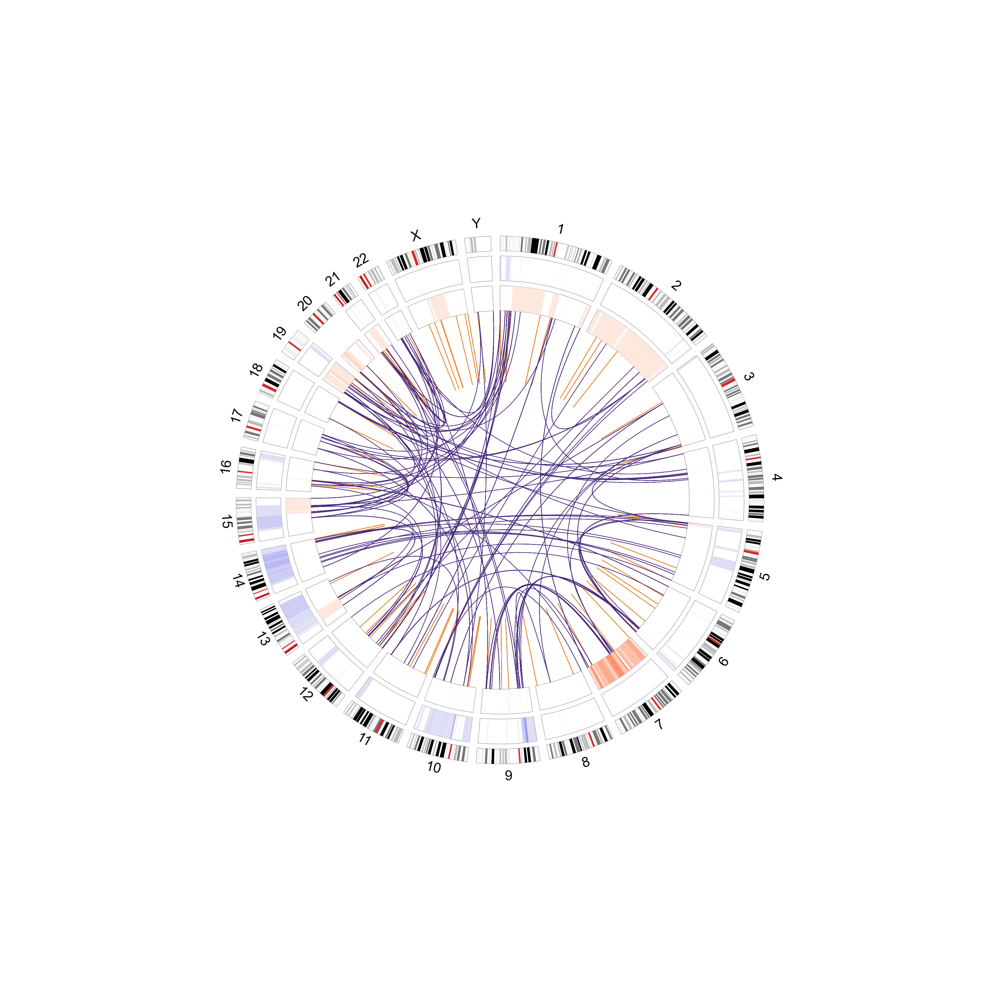

In [14]:
circle.figure

In [15]:
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1) 


<Figure size 432x288 with 0 Axes>

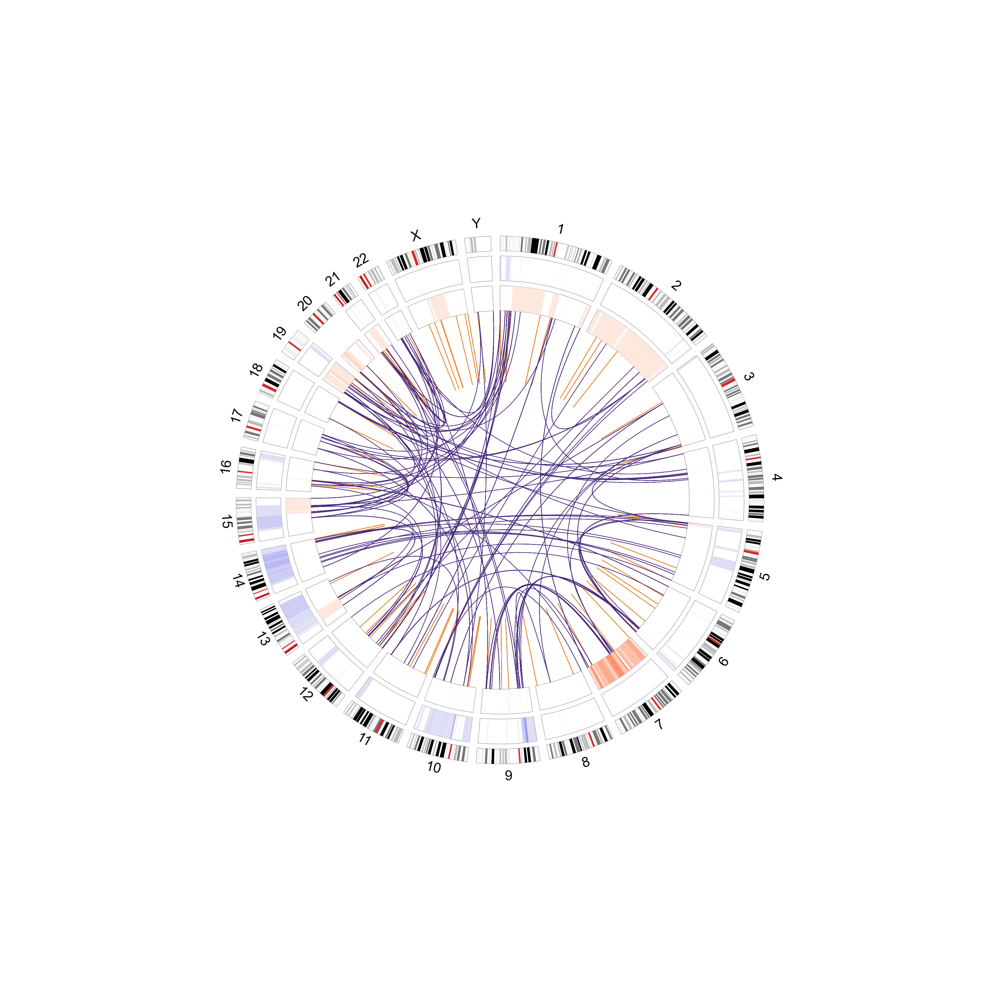

In [16]:
circle.figure

In [17]:
circle.figure.savefig("/Users/ryanyutian/Desktop/Manuscript/CIRCOS/plot/primary_sample_CIRCOS_percent.png")

In [18]:
from PIL import Image

def crop_image(input_path, output_path, padding=750):
    img = Image.open(input_path)
    width, height = img.size

    # Define the points for cropping, adjust the values as needed
    # Note: The order of the box tuple is (left, upper, right, lower)
    box = (padding, padding, width - padding, height - padding)
    
    cropped_img = img.crop(box)
    cropped_img.save(output_path)


In [19]:
crop_image("/Users/ryanyutian/Desktop/Manuscript/CIRCOS/plot/primary_sample_CIRCOS_percent.png", 
           "/Users/ryanyutian/Desktop/Manuscript/CIRCOS/plot/primary_sample_CIRCOS_percent_crop.png")


# Recurrent Samples

In [20]:
#Set chromosomes
circle = Gcircle(figsize=(50,50))
with open("/Users/ryanyutian/Desktop/202306_CIRCOS/hg38_chromosome_general.csv") as f:
    f.readline()
    for line in f:
        line   = line.rstrip().split(",")
        name   = line[0][3:]
        length = int(line[-1]) 
        arc    = Garc(arc_id=name, size=length, interspace=2, facecolor="#FFFFFF00", \
                      raxis_range=(500,530), labelposition=40, label_visible=True, labelsize=50)
        circle.add_garc(arc)

<Figure size 3600x3600 with 0 Axes>

In [21]:
circle.set_garcs() 

In [22]:
#cytoband
import collections
color_dict   = {"gneg":"#FFFFFF00", "gpos25":"#EEEEEE", "gpos50":"#BBBBBB", "gpos75":"#777777", "gpos100":"#000000", "gvar":"#FFFFFF00", "stalk":"#C01E27", 
               "acen":"#D82322"}

arcdata_dict = collections.defaultdict(dict)
with open("/Users/ryanyutian/Desktop/202306_CIRCOS/hg38_chromosome_cytoband.csv") as f:
    f.readline()
    for line in f:
        line  = line.rstrip().split(",")
        name  = line[0][3:]   
        start = int(line[1])-1 
        width = int(line[2])-(int(line[1])-1) 
        if name not in arcdata_dict:
            arcdata_dict[name]["positions"] = []
            arcdata_dict[name]["widths"]    = [] 
            arcdata_dict[name]["colors"]    = [] 
        arcdata_dict[name]["positions"].append(start) 
        arcdata_dict[name]["widths"].append(width)
        arcdata_dict[name]["colors"].append(color_dict[line[-1]])

for key in arcdata_dict:
    circle.barplot(key, data=[1]*len(arcdata_dict[key]["positions"]), positions=arcdata_dict[key]["positions"], 
                   width=arcdata_dict[key]["widths"], raxis_range=[500,530], facecolor=arcdata_dict[key]["colors"])    
    

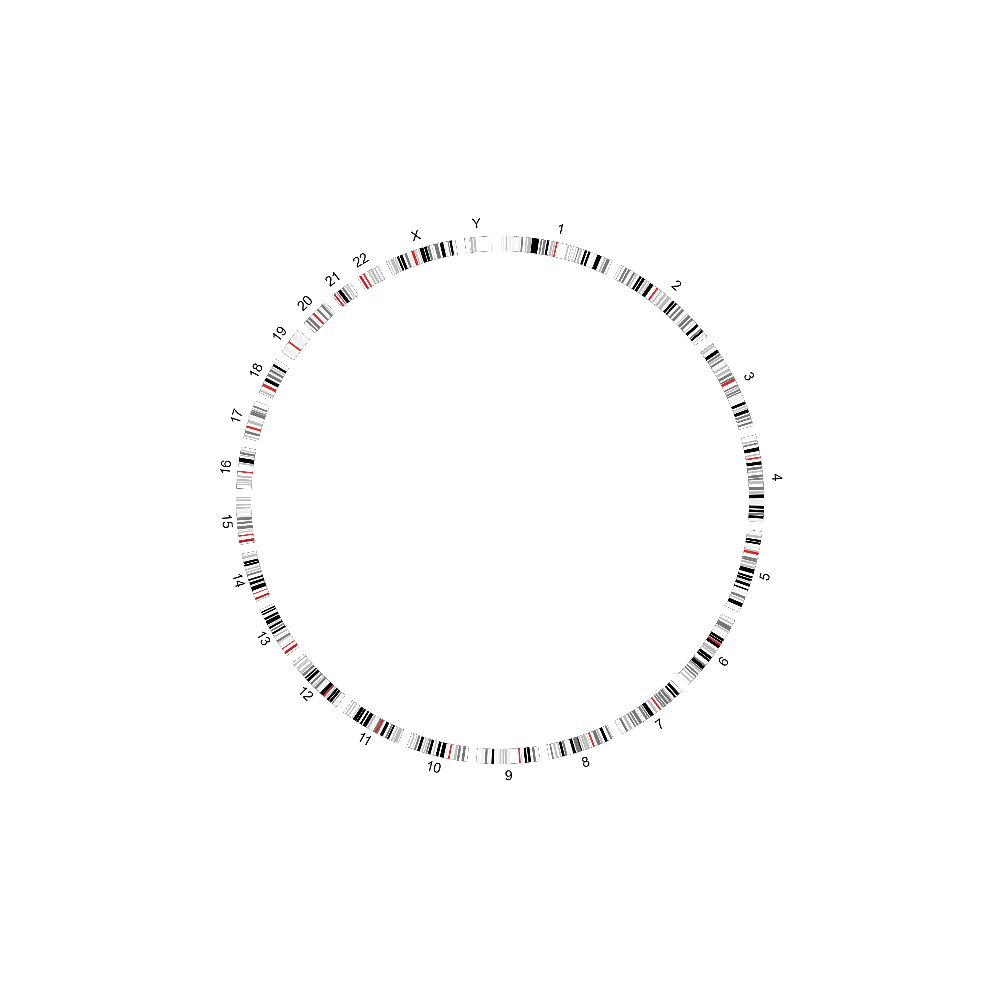

In [23]:
circle.figure

In [24]:
#heatmap
values_all   = [] 
arcdata_dict = collections.defaultdict(dict)
with open("/Users/ryanyutian/Desktop/Manuscript/CIRCOS/primary_relapse_data/recurrent/large_DEL_heatmap_recurrent_sample_percent.csv") as f:
    f.readline()
    for line in f:
        line  = line.rstrip().split(",")
        name  = line[0][3:]
        start = int(line[1])-1
        end   = int(line[2]) 
        width = end-start
        if name not in arcdata_dict:
            arcdata_dict[name]["positions"] = []
            arcdata_dict[name]["widths"]    = [] 
            arcdata_dict[name]["values"]    = [] 
        arcdata_dict[name]["positions"].append(start) 
        arcdata_dict[name]["widths"].append(width)
        arcdata_dict[name]["values"].append(float(line[-1]))
        values_all.append(float(line[-1]))

vmin, vmax = 0, 1

for key in arcdata_dict:
    circle.heatmap(key, data=arcdata_dict[key]["values"], positions=arcdata_dict[key]["positions"], 
                   width=arcdata_dict[key]["widths"], raxis_range=[440,490], vmin=vmin, vmax=vmax, 
                   cmap=sns.color_palette("light:b", as_cmap=True), spine=True)

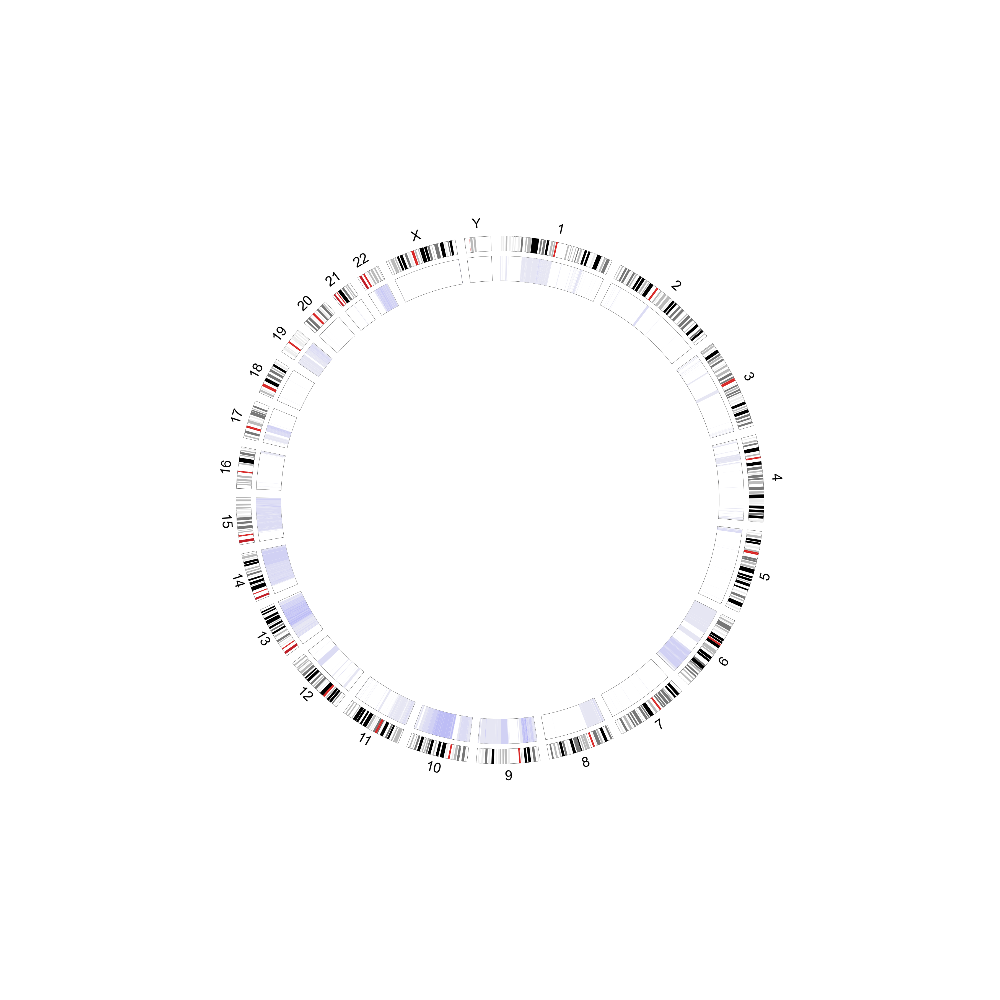

In [25]:
circle.figure

In [26]:
#heatmap
values_all   = [] 
arcdata_dict = collections.defaultdict(dict)
with open("/Users/ryanyutian/Desktop/Manuscript/CIRCOS/primary_relapse_data/recurrent/large_DUP_heatmap_recurrent_sample_percent.csv") as f:
    f.readline()
    for line in f:
        line  = line.rstrip().split(",")
        name  = line[0][3:]    
        start = int(line[1])-1
        end   = int(line[2]) 
        width = end-start 
        if name not in arcdata_dict:
            arcdata_dict[name]["positions"] = []
            arcdata_dict[name]["widths"]    = [] 
            arcdata_dict[name]["values"]    = [] 
        arcdata_dict[name]["positions"].append(start) 
        arcdata_dict[name]["widths"].append(width)
        arcdata_dict[name]["values"].append(float(line[-1]))
        values_all.append(float(line[-1]))

vmin, vmax = 0, 1
for key in arcdata_dict:
    circle.heatmap(key, data=arcdata_dict[key]["values"], positions=arcdata_dict[key]["positions"], 
                   width=arcdata_dict[key]["widths"], raxis_range=[380,430], vmin=vmin, vmax=vmax, 
                   cmap=plt.cm.Reds, spine=True)

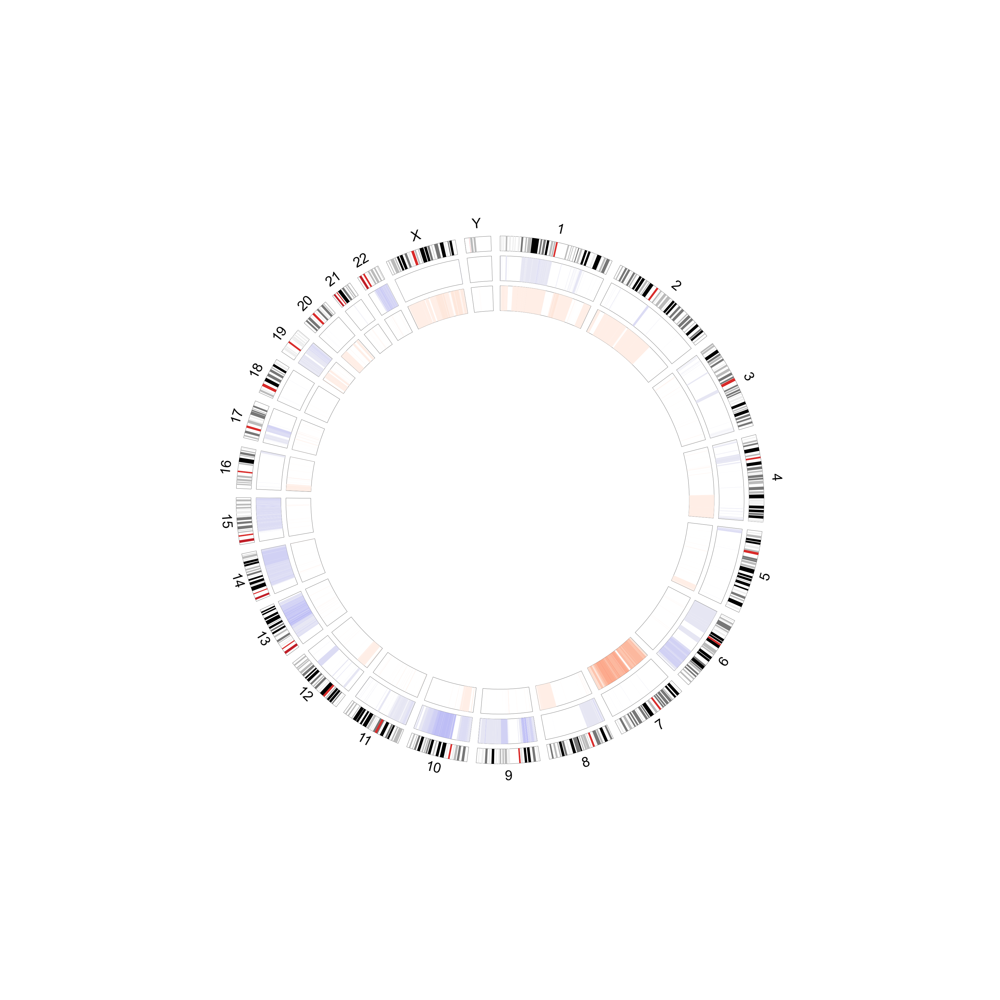

In [27]:
circle.figure

In [28]:
#linkplot - inversion

values_all   = [] 
arcdata_dict = collections.defaultdict(dict)

with open("/Users/ryanyutian/Desktop/Manuscript/CIRCOS/primary_relapse_data/recurrent_sample_inversion.csv") as f:
    f.readline()
    for line in f:
        line  = line.rstrip().split(",")
        name1  = line[0][3:]
        start1 = int(line[1])-1
        end1   = int(line[2])
        name2  = line[3][3:]
        start2 = int(line[4])-1
        end2   = int(line[5])
        source = (name1, start1, end1, 380)
        destination = (name2, start2, end2, 380)
        circle.chord_plot(source, destination, edgecolor="#E67E22", linewidth=2)


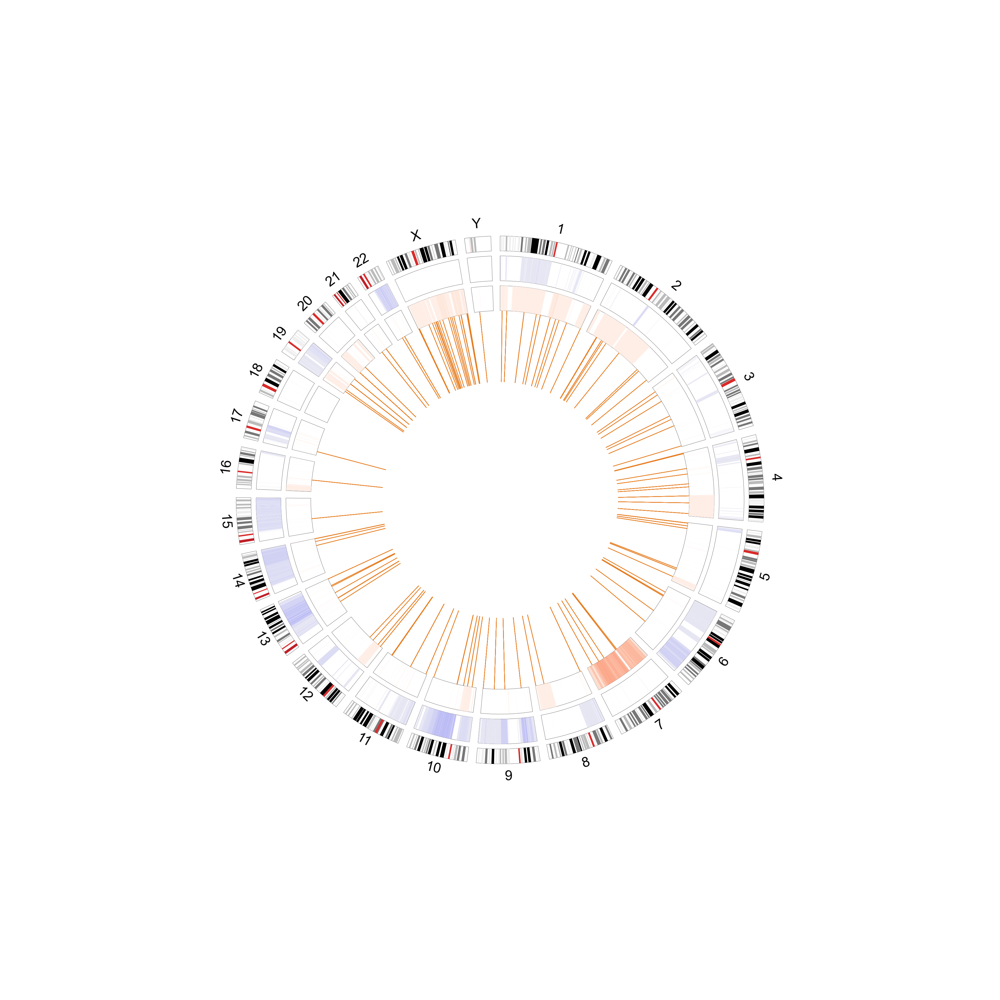

In [29]:
circle.figure

In [30]:
#linkplot - Translocation

values_all   = [] 
arcdata_dict = collections.defaultdict(dict)

with open("/Users/ryanyutian/Desktop/Manuscript/CIRCOS/primary_relapse_data/recurrent_sample_translocation.csv") as f:
    f.readline()
    for line in f:
        line  = line.rstrip().split(",")
        name1  = line[0][3:]
        start1 = int(line[1])-1
        end1   = int(line[2])
        name2  = line[3][3:]
        start2 = int(line[4])-1
        end2   = int(line[5])
        source = (name1, start1, end1, 380)
        destination = (name2, start2, end2, 380)
        circle.chord_plot(source, destination, edgecolor="#4C2D7F", linewidth=2)


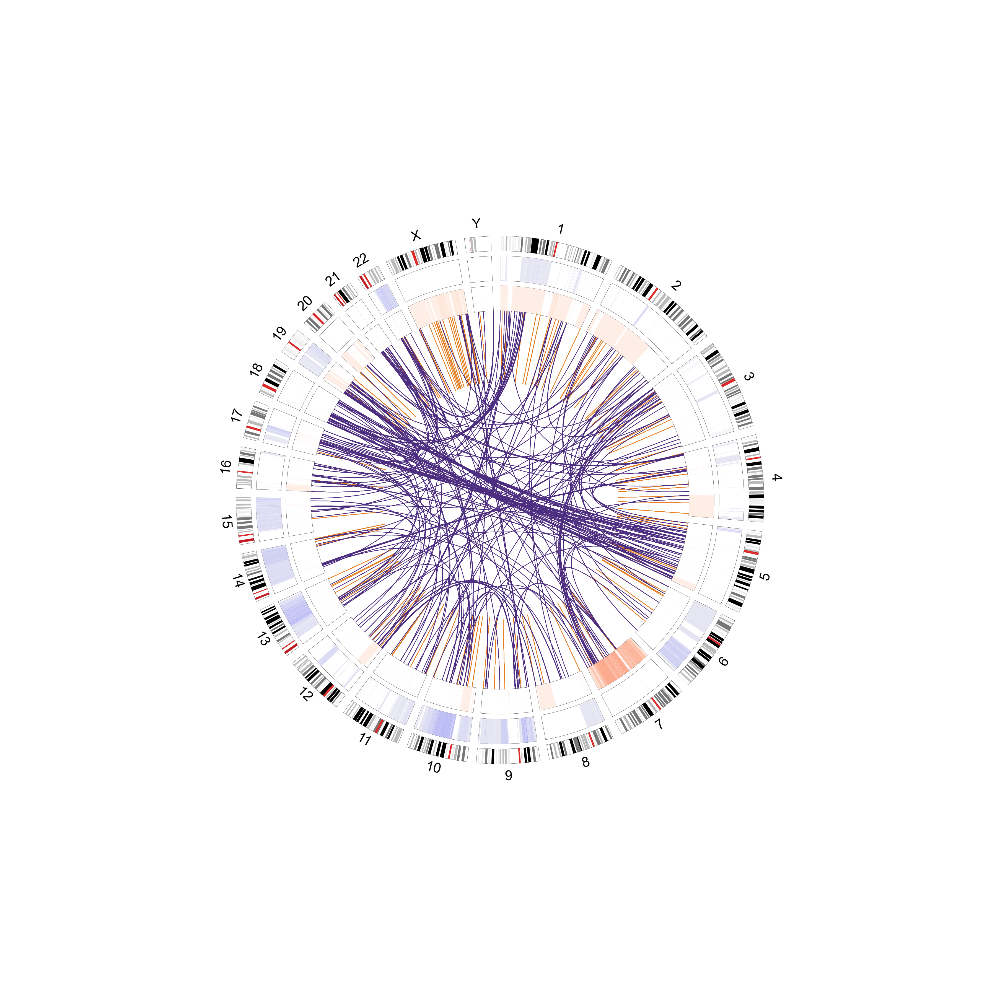

In [31]:
circle.figure

In [32]:
circle.figure.savefig("/Users/ryanyutian/Desktop/Manuscript/CIRCOS/plot/recurrent_sample_CIRCOS_percent.png")

In [33]:
crop_image("/Users/ryanyutian/Desktop/Manuscript/CIRCOS/plot/recurrent_sample_CIRCOS_percent.png", 
           "/Users/ryanyutian/Desktop/Manuscript/CIRCOS/plot/recurrent_sample_CIRCOS_percent_crop.png")
